In [5]:
import numpy as np
import numpy.linalg as la
from scipy import sparse
from matplotlib import tri
from matplotlib import rcParams
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from tqdm import tqdm
import torch
from IPython.display import HTML
import gdown
from torchdiffeq import odeint
from matplotlib import animation, cm


In [6]:
file_id = '1zA1DlxYne3YQgyVUpAm7mJkmaROF-Ali'
download_link = f'https://drive.google.com/uc?id={file_id}'
# Download the mesh file
output = 'narrowing_channel.ply2'
gdown.download(download_link, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1zA1DlxYne3YQgyVUpAm7mJkmaROF-Ali
To: /storage/work/amb10399/project/SC-Neural-Operator/GSNO/narrowing_channel.ply2
100%|██████████| 59.0k/59.0k [00:00<00:00, 6.87MB/s]


'narrowing_channel.ply2'

In [7]:
class TriMesh:
    def __init__(self, filename, filetype, refine=0):
        V, E = self.read_mesh(filename, filetype)
        t = tri.Triangulation(V[:, 0], V[:, 1], E)

        if refine > 0:
            refiner = tri.UniformTriRefiner(t)
            t = refiner.refine_triangulation(subdiv=refine)
            V = np.vstack((t.x, t.y)).T
            E = t.triangles

        ncell = E.shape[0]
        cells = np.mean(V[E], axis = 1)
        areas = np.zeros(ncell)
        faces = t.edges
        nface = faces.shape[0]
        normals = np.zeros((nface, 2))
        fid2cid = np.zeros((nface, 2), dtype=np.int32)
        face_type = np.zeros(nface, dtype=np.int8)
        l = np.zeros(nface)

        vid_to_fid = {}

        # map vertex pair to face id
        for fid in range(nface):
            vid0, vid1 = faces[fid]
            v_key = (vid0, vid1) if vid0 < vid1 else (vid1, vid0)
            vid_to_fid[v_key] = fid

        for cid, vids in enumerate(t.triangles):
            # link cell id with face id
            # boundary face has two identical cell id
            for i, j in zip([0, 1, 2], [1, 2, 0]):
                v_key = (vids[i], vids[j]) if vids[i] < vids[j] else (vids[j], vids[i])
                fid = vid_to_fid[v_key]
                if face_type[fid] == 0:
                    fid2cid[fid] = np.array([cid, cid])
                    face_type[fid] = 1
                else:
                    old_cid = fid2cid[fid]
                    if cid < old_cid[0]:
                        fid2cid[fid, 0] = cid
                    else:
                        fid2cid[fid, 1] = cid

                    face_type[fid] = 2

            # compute cell volume (area)
            areas[cid] = 0.5 * np.abs(la.det(np.vstack((np.ones(3), V[vids].T))))


        for i, face in enumerate(faces):
            v0, v1 = V[face[0]], V[face[1]]
            tan = v0 - v1
            l[i] = la.norm(tan)
            n = np.array([-tan[1], tan[0]])

            # TODO: double check normal direction
            # normal point from c0 to c1
            c0 = cells[fid2cid[i, 0]]
            if n.dot((v0+v1)/2 - c0) < 0:
                normals[i] = -n / la.norm(n)
            else:
                normals[i] = n / la.norm(n)


        self.t = t
        self.cells = cells
        self.normals = normals
        self.fid2cid = fid2cid
        self.face_len = l
        self.areas = areas
        self.bndf_mask = (face_type == 1)
        self.ncell = ncell
        self.nface = nface

    def read_mesh(self, name, type='.'):
        if type == '.ply2':
            with open(name+type) as f:
                vnum = int(next(f))
                enum = int(next(f))
                v = [[float(x) for x in next(f).split()] for i in range(vnum)]
                e = [[int(x) for x in next(f).split()] for i in range(enum)]

            vertices = np.array(v)[:, :2]
            triangles = np.array(e, dtype=int)[:, 1:]
            # save file

        elif type == '.':
            vertices = np.loadtxt('mesh.v')
            triangles = np.loadtxt('mesh.e', dtype=int)

        else:
            raise "Unknown mesh file type."

        return vertices, triangles

    def plot(self, show_one_edge=False):
        fig, ax = plt.subplots()
        ax.set_aspect(1)
        ax.triplot(self.t.x, self.t.y, self.t.triangles, color='gray')
        print("Total cell number in triangle mesh: ", self.ncell)
        if show_one_edge:
            fid = 0
            vtx = np.vstack((self.t.x, self.t.y)).T
            v0 = vtx[self.t.edges[fid, 0]]
            v1 = vtx[self.t.edges[fid, 1]]
            c0 = self.cells[self.fid2cid[fid, 0]]
            c1 = self.cells[self.fid2cid[fid, 1]]
            ax.scatter(c0[0], c0[1], color='green', label='c0')
            ax.scatter(c1[0], c1[1], color='blue', label='c1')
            ax.scatter(v0[0], v0[1], color='red', marker='.')
            ax.scatter(v1[0], v1[1], color='red', marker='.')
            ax.quiver(*((v0 + v1) / 2), self.normals[fid, 0], self.normals[fid, 1], headaxislength=2, headlength=3, width=0.003, label='normal')

        plt.show()


In [8]:
def create_initial_condition(cells, device):
    """Create initial condition tensor directly"""
    x = torch.tensor(cells[:, 0], dtype=torch.float32, device=device)
    condition = x < -4.5
    return torch.where(condition,
                      torch.tensor(5., device=device),
                      torch.tensor(1., device=device))

def create_bed_topography(cells, device):
    """Create bed elevation (analytical function)"""
    x = torch.tensor(cells[:, 0], dtype=torch.float32, device=device)
    y = torch.tensor(cells[:, 1], dtype=torch.float32, device=device)

    # Parameters for Gaussian bump
    h_max = 0.20  # Maximum height
    x0, y0 = -4.0, 0.0  # Center
    sigma = 1.0  # Width

    # Compute bed elevation
    r2 = (x - x0)**2 + (y - y0)**2
    b = h_max * torch.exp(-r2/(2*sigma**2))

    return b

def compute_bed_derivatives(mesh, f_values, device, polynomial_order=5):
    """
    Compute derivatives using high-order polynomial reconstruction
    Uses quadratic polynomial: f(x,y) = a0 + a1*x + a2*y + a3*x^2 + a4*x*y + a5*y^2
    """
    ncell = mesh.ncell
    df_dx = torch.zeros(ncell, device=device)
    df_dy = torch.zeros(ncell, device=device)

    cells = torch.tensor(mesh.cells, dtype=torch.float32, device=device)
    fid2cid = torch.tensor(mesh.fid2cid, dtype=torch.long, device=device)

    def get_extended_neighbors(cell_idx, level=2):
        """Get neighbors up to specified level"""
        neighbors = {cell_idx}
        current_neighbors = {cell_idx}

        for _ in range(level):
            next_neighbors = set()
            for n in current_neighbors:
                faces = (fid2cid[:, 0] == n) | (fid2cid[:, 1] == n)
                new_neighbors = set(fid2cid[faces].flatten().cpu().numpy())
                next_neighbors.update(new_neighbors)
            current_neighbors = next_neighbors - neighbors
            neighbors.update(current_neighbors)

        neighbors.remove(cell_idx)
        return torch.tensor(list(neighbors), device=device)

    def build_polynomial_system(x0, y0, neighbor_points, neighbor_values):
        """Build system for polynomial fitting"""
        dx = neighbor_points[:, 0] - x0
        dy = neighbor_points[:, 1] - y0

        if polynomial_order == 2:
            # For quadratic polynomial: f = a0 + a1*x + a2*y + a3*x^2 + a4*x*y + a5*y^2
            A = torch.stack([
                torch.ones_like(dx),
                dx,
                dy,
                dx**2,
                dx*dy,
                dy**2
            ]).T
        else:  # Linear fallback
            A = torch.stack([
                torch.ones_like(dx),
                dx,
                dy
            ]).T

        return A, neighbor_values

    for i in range(ncell):
        # Get extended neighborhood
        neighbors = get_extended_neighbors(i)

        if len(neighbors) >= 6:  # Need at least 6 points for quadratic fit
            # Center coordinate
            x0, y0 = cells[i]

            # Neighbor coordinates and values
            neighbor_points = cells[neighbors]
            neighbor_values = f_values[neighbors]

            # Build and solve polynomial system
            A, b = build_polynomial_system(x0, y0, neighbor_points, neighbor_values)

            try:
                # Solve using least squares with SVD for better stability
                U, S, Vh = torch.linalg.svd(A)
                # Filter small singular values
                threshold = S.max() * 1e-10
                S_inv = torch.where(S > threshold, 1/S, torch.zeros_like(S))
                coeffs = (Vh.T * S_inv.unsqueeze(0)) @ (U.T @ b)

                if polynomial_order == 2:
                    # Derivatives at (x0,y0):
                    # df/dx = a1 + 2*a3*x + a4*y
                    # df/dy = a2 + a4*x + 2*a5*y
                    df_dx[i] = coeffs[1] + 2*coeffs[3]*0 + coeffs[4]*0  # at x=0,y=0 (relative coords)
                    df_dy[i] = coeffs[2] + coeffs[4]*0 + 2*coeffs[5]*0  # at x=0,y=0 (relative coords)
                else:
                    df_dx[i] = coeffs[1]  # Linear derivatives
                    df_dy[i] = coeffs[2]

            except:
                # Fallback to simpler method if SVD fails
                try:
                    # Try linear fit as fallback
                    A = A[:, :3]  # Use only constant and linear terms
                    coeffs = torch.linalg.lstsq(A, b).solution
                    df_dx[i] = coeffs[1]
                    df_dy[i] = coeffs[2]
                except:
                    # Ultimate fallback to basic finite difference
                    if len(neighbors) > 0:
                        dx = neighbor_points[:, 0] - x0
                        dy = neighbor_points[:, 1] - y0
                        df = neighbor_values - f_values[i]

                        distances = torch.sqrt(dx**2 + dy**2)
                        weights = 1.0 / (distances + 1e-10)
                        weights = weights / weights.sum()

                        df_dx[i] = torch.sum(weights * df / (dx + 1e-10))
                        df_dy[i] = torch.sum(weights * df / (dy + 1e-10))

        else:  # Not enough neighbors for high-order fit
            neighbors = get_extended_neighbors(i, level=1)  # Try with fewer neighbors
            if len(neighbors) >= 3:  # Minimum for linear fit
                x0, y0 = cells[i]
                neighbor_points = cells[neighbors]
                neighbor_values = f_values[neighbors]

                dx = neighbor_points[:, 0] - x0
                dy = neighbor_points[:, 1] - y0
                df = neighbor_values - f_values[i]

                distances = torch.sqrt(dx**2 + dy**2)
                weights = 1.0 / (distances + 1e-10)
                weights = weights / weights.sum()

                df_dx[i] = torch.sum(weights * df / (dx + 1e-10))
                df_dy[i] = torch.sum(weights * df / (dy + 1e-10))

    return df_dx, df_dy


In [9]:
class SWEFunction(torch.nn.Module):
    def __init__(self, mesh: TriMesh, g=1, device='cuda' if torch.cuda.is_available() else 'cpu'):
        super().__init__()
        self.mesh = mesh
        self.device = device

        # Convert mesh properties to torch tensors
        self.normals = torch.tensor(mesh.normals, dtype=torch.float32, device=device)
        self.face_len = torch.tensor(mesh.face_len, dtype=torch.float32, device=device)
        self.areas = torch.tensor(mesh.areas, dtype=torch.float32, device=device)
        self.fid2cid = torch.tensor(mesh.fid2cid, dtype=torch.long, device=device)
        self.bndf_mask = torch.tensor(mesh.bndf_mask, device=device)

        self.g = torch.tensor(g, dtype=torch.float32, device=device)

        # Pre-compute indices
        self.nface = mesh.nface
        self.c0 = self.fid2cid[:, 0]
        self.c1 = self.fid2cid[:, 1]

        # Add bed topography
        self.b = create_bed_topography(mesh.cells, device)
        self.db_dx, self.db_dy = compute_bed_derivatives(mesh, self.b, device)

    def wall_bc(self, u):
        """Compute wall boundary conditions"""
        u_by_face = u[:, self.c0]
        mask = self.bndf_mask
        ub = u_by_face[:, mask]

        hb = ub[0]
        vxb = ub[1] / hb
        vyb = ub[2] / hb

        normalsb = self.normals[mask]
        proj_len = vxb * normalsb[:, 0] + vyb * normalsb[:, 1]
        vx_inv = vxb - 2 * proj_len * normalsb[:, 0]
        vy_inv = vyb - 2 * proj_len * normalsb[:, 1]

        ub_inv = torch.stack([hb, hb*vx_inv, hb*vy_inv])
        Fxb_inv = torch.stack([
            hb*vx_inv,
            hb*vx_inv**2 + self.g/2 * hb**2,
            hb*vx_inv*vy_inv
        ])
        Fyb_inv = torch.stack([
            hb*vy_inv,
            hb*vx_inv*vy_inv,
            hb*vy_inv**2 + self.g/2 * hb**2
        ])

        F_bnd = Fxb_inv * normalsb[:, 0].unsqueeze(0) + Fyb_inv * normalsb[:, 1].unsqueeze(0)
        jmp_bnd = ub_inv - ub

        return F_bnd, jmp_bnd

    def forward(self, t, u):
        """Compute du/dt for odeint"""
        h = u[0]
        vx = u[1] / h
        vy = u[2] / h

        Fx = torch.stack([
            h*vx,
            h*vx**2 + self.g/2 * h**2,
            h*vx*vy
        ])
        Fy = torch.stack([
            h*vy,
            h*vx*vy,
            h*vy**2 + self.g/2 * h**2
        ])

        # Source terms for bed topography
        S = torch.stack([
            torch.zeros_like(h, device=self.device),
            -self.g * h * self.db_dx,
            -self.g * h * self.db_dy
        ])

        F0 = Fx[:, self.c0] * self.normals[:, 0].unsqueeze(0) + Fy[:, self.c0] * self.normals[:, 1].unsqueeze(0)
        F1 = Fx[:, self.c1] * self.normals[:, 0].unsqueeze(0) + Fy[:, self.c1] * self.normals[:, 1].unsqueeze(0)

        spd0 = torch.abs(vx[self.c0] * self.normals[:, 0] + vy[self.c0] * self.normals[:, 1]) + torch.sqrt(self.g * h[self.c0])
        spd1 = torch.abs(vx[self.c1] * self.normals[:, 0] + vy[self.c1] * self.normals[:, 1]) + torch.sqrt(self.g * h[self.c1])
        spd = torch.maximum(spd0, spd1)

        jmp = u[:, self.c1] - u[:, self.c0]

        F_bnd, jmp_bnd = self.wall_bc(u)
        mask = self.bndf_mask
        F1[:, mask] = F_bnd
        jmp[:, mask] = jmp_bnd

        F = (F0 + F1) / 2 - spd.unsqueeze(0) * jmp / 2

        # Compute fluxes (without dt multiplication as odeint handles time stepping)
        flux0 = -F * self.face_len.unsqueeze(0) / self.areas[self.c0].unsqueeze(0)
        flux1 = torch.zeros_like(flux0, device=self.device)
        flux1[:, ~mask] = (F * self.face_len.unsqueeze(0) / self.areas[self.c1].unsqueeze(0))[:, ~mask]

        # Combine updates
        update = torch.zeros_like(u)
        for i in range(3):
            update[i].scatter_add_(0, self.c0, flux0[i])
            update[i].scatter_add_(0, self.c1, flux1[i])

        # Return du/dt = spatial discretization + source terms
        return update + S

class TorchMeshSolverODE:
    def __init__(self, mesh: TriMesh, g=1, device='cuda' if torch.cuda.is_available() else 'cpu'):
        self.device = device
        self.swe_function = SWEFunction(mesh, g, device)
        self.mesh = mesh
        self.u = None
        self.time = 0

    def init_height(self, height):
        """Initialize with pre-computed height tensor"""
        self.u = torch.zeros((3, self.mesh.ncell), dtype=torch.float32, device=self.device)
        self.u[0] = height

    def solve(self, t):
        """Solve using torchdiffeq"""

        # Use odeint with the chosen method
        solution = odeint(
            self.swe_function,
            self.u,
            t,
            method='rk4'
        )
        return solution, t

    def get_numpy_state(self):
        """Convert current state to numpy for visualization"""
        return self.u.cpu().numpy()

Total cell number in triangle mesh:  1658


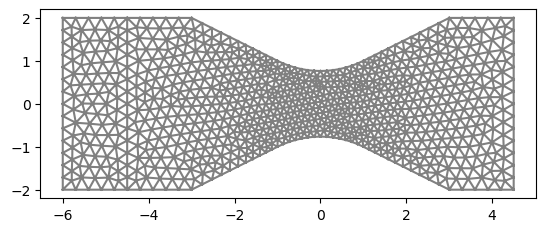

In [10]:
tri_mesh = TriMesh('narrowing_channel', '.ply2', refine=0)
# tri_mesh = TriMesh('breakwater', '.ply2', refine=0)
tri_mesh.plot()

In [11]:
from typing import Tuple
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, cm
from matplotlib.colors import Normalize
from tqdm import tqdm
from IPython.display import HTML

def simulate_and_plot_torch_ode(
    m_solver: TorchMeshSolverODE,
    target_time: float,
    time_steps: int,
    norm_h: Normalize,
    norm_v: Normalize,
    device: torch.device
) -> Tuple[animation.ArtistAnimation, torch.Tensor, torch.Tensor]:
    """
    Simulate and visualize ODE solution for shallow water equations.

    Args:
        m_solver: Mesh solver instance
        target_time: End time for simulation
        time_steps: Number of time steps
        norm_h: Normalization for water height
        norm_v: Normalization for velocity
        device: Torch device

    Returns:
        Tuple containing:
        - Animation object
        - Solution tensor (permuted)
        - Time points tensor
    """
    # Solve for the entire time domain
    t = torch.linspace(0, target_time, time_steps, device=device)
    solution, t = m_solver.solve(t)

    # Create figure and axes
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    for ax in axes:
        ax.set_aspect(1)

    # Set titles and colorbars
    axes[0].set_title("Water height (mesh)")
    axes[1].set_title("Velocity magnitude (mesh)")
    axes[2].set_title("Bed elevation")

    fig.colorbar(cm.ScalarMappable(norm=norm_h), ax=axes[0], location='bottom')
    fig.colorbar(cm.ScalarMappable(norm=norm_v), ax=axes[1], location='bottom')
    fig.colorbar(cm.ScalarMappable(norm=Normalize(0, 0.2)), ax=axes[2], location='bottom')

    # Plot bed elevation (static)
    bed = axes[2].tripcolor(m_solver.mesh.t, m_solver.swe_function.b.cpu().numpy(), norm=Normalize(0, 0.3))

    frames = []
    total_steps = solution.shape[0]
    frame_indices = np.linspace(0, total_steps-1, time_steps, dtype=int)

    for idx in tqdm(frame_indices):
        u_np = solution[idx].cpu().numpy()
        vx = u_np[1] / u_np[0]
        vy = u_np[2] / u_np[0]

        im_h = axes[0].tripcolor(m_solver.mesh.t, u_np[0], animated=True, norm=norm_h)
        im_v = axes[1].tripcolor(m_solver.mesh.t, np.sqrt(vx**2 + vy**2), animated=True, norm=norm_v)
        frames.append([im_h, im_v])

    anim = animation.ArtistAnimation(fig, frames, interval=200, blit=True)
    plt.close()

    return anim, solution.permute(2, 0, 1), t


In [12]:
# Usage example:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
initial_height = create_initial_condition(tri_mesh.cells, device)
torch_solver = TorchMeshSolverODE(tri_mesh, g=2.0, device=device)
torch_solver.init_height(initial_height)

norm_h = Normalize(0, 5)
norm_v = Normalize(0, 3)

ani, solution, t = simulate_and_plot_torch_ode(torch_solver, target_time=2, time_steps=200, norm_h=norm_h, norm_v=norm_v, device=device)
HTML(ani.to_jshtml())

100%|██████████| 200/200 [00:04<00:00, 44.70it/s]
